<a href="https://colab.research.google.com/github/yonitsur/Compiler/blob/main/waste_segmentation_demo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<a name="0-2"></a>
### Choose the GPU Runtime
- Make sure your runtime is **GPU**. You can select in settings by going to `Runtime -> Change runtime type -> Select a GPU and then press SAVE`

In [ ]:
import matplotlib.pyplot as plt
import cv2
import yaml
import os
import torch
import copy
from PIL import Image
from torchvision import transforms, utils
import torch.optim as optim
from torch.optim import lr_scheduler
import torch.nn as nn
from tqdm import tqdm
from torchvision.models import resnet50, ResNet50_Weights
import torchvision
import sys
import numpy as np
import skimage.feature as feature
import torch.nn.functional as F
import random

print("PyTorch version:", torch.__version__)
print("Torchvision version:", torchvision.__version__)
print("CUDA is available:", torch.cuda.is_available())

PyTorch version: 2.2.1+cu121
Torchvision version: 0.17.1+cu121
CUDA is available: True


In [ ]:
reverse_labels_dict = {
    0: 'Metal',
    1: 'Wood',
    2: 'Carton+Paper',
    3: 'Rigid polymers',
    4: 'Flexible polymers',
    5: 'Mineral',
    # 6:'Rubber',
    6: 'Background',
    7: 'Other'
}

labels_colors = {
    'Metal': (0.1, 0.1, 0.1),
    # 'Metal': (1, 1, 1),
    'Wood': (1, 1, 0),
    'Carton+Paper': (0.5, 0.2, 0),
    'Rigid polymers': (1, 0, 0),
    'Flexible polymers': (1, 0, 0.8),
    'Mineral': (1, 0.63, 0),
    'Background': (0, 1, 0),
    # 'Background': (0, 0, 0),
    'Other': (0.5, 0, 1),
    # 'Rubber':(1, 0, 1)
}

NORMALIZE = True

MIN_MASK_SIZE = 1000

folder_path = "/content"


## Download SAM

In [ ]:
!{sys.executable} -m pip install opencv-python matplotlib
!{sys.executable} -m pip install 'git+https://github.com/facebookresearch/segment-anything.git'
!wget https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth

from segment_anything.utils.amg import *
from segment_anything import sam_model_registry, SamAutomaticMaskGenerator, SamPredictor
from segment_anything.utils.amg import *

sam_checkpoint = "sam_vit_h_4b8939.pth"
model_type = "vit_h"
device = "cuda"
sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
sam.to(device=device)

mask_generator = SamAutomaticMaskGenerator(
    model=sam,
    points_per_side=25,
    pred_iou_thresh=0.92,
    stability_score_thresh=0.75,
    crop_n_layers=0,
    crop_n_points_downscale_factor=1,
    box_nms_thresh=0.35,
    min_mask_region_area=1000,
    output_mode="uncompressed_rle",
)

  Cloning https://github.com/facebookresearch/segment-anything.git to /tmp/pip-req-build-orsaj22n
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/segment-anything.git /tmp/pip-req-build-orsaj22n
  Resolved https://github.com/facebookresearch/segment-anything.git to commit 6fdee8f2727f4506cfbbe553e23b895e27956588
  Preparing metadata (setup.py) ... done
  Created wheel for segment-anything: filename=segment_anything-1.0-py3-none-any.whl size=36590 sha256=4dce0d00784c9ed12f696550d4e1b23f676c4c83ad96357ba01b5db8f1db5196
  Stored in directory: /tmp/pip-ephem-wheel-cache-501_tzak/wheels/10/cf/59/9ccb2f0a1bcc81d4fbd0e501680b5d088d690c6cfbc02dc99d
Successfully built segment-anything
--2024-05-06 08:51:56--  https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth
Resolving dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 108.156.133.4, 108.156.133.37, 108.156.133.117, ...
Connecting to dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)|108

# Load image

### ***Option 1*** :  Download example image


In [ ]:
!gdown --id 1vWGt4T72QdeDbNv1j1LEzoaNqciGMaBK
file_path = 'DJI_20230221091309_0089_V.jpg'

/usr/local/lib/python3.10/dist-packages/gdown/__main__.py:132: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=1vWGt4T72QdeDbNv1j1LEzoaNqciGMaBK
To: /content/DJI_20230221091309_0089_V.jpg
100% 10.6M/10.6M [00:00<00:00, 19.9MB/s]


### ***Option 2*** : Upload your own image

In [ ]:
# from google.colab import files

# uploaded = files.upload()
# for fn in uploaded.keys():
#     file_path = fn
#     print('User uploaded file "{name}" with length {length} bytes'.format(
#         name=fn, length=len(uploaded[fn])))

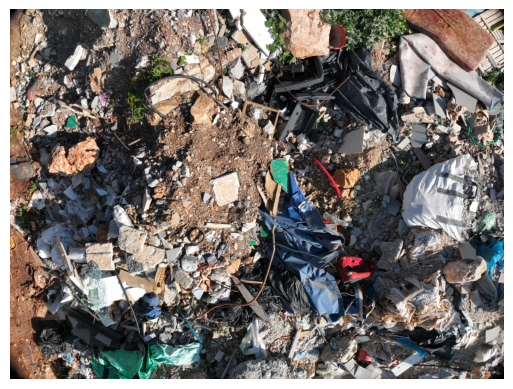

In [ ]:
img = Image.open(file_path)
plt.imshow(img)
plt.axis('off')
plt.show()

# Utilities

In [ ]:
def split_image(image, num_rows, num_cols):
    height, width = image.shape[:2]
    split_height = height // num_rows
    split_width = width // num_cols
    splits = []
    for r in range(num_rows):
        for c in range(num_cols):
            split = image[r * split_height:(r + 1) * split_height, c * split_width:(c + 1) * split_width]
            splits.append(split)
    return splits


def crop_object(image, mask):
    contours, _ = cv2.findContours(mask.astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    largest_contour = max(contours, key=cv2.contourArea)
    contour_mask = np.zeros_like(mask, dtype=np.uint8)
    cv2.drawContours(contour_mask, [largest_contour], 0, 255, -1)
    cropped_image = cv2.bitwise_and(image, image, mask=contour_mask.T)
    max_x = max([largest_contour[i][0][1] for i in range(largest_contour.shape[0])])
    min_x = min([largest_contour[i][0][1] for i in range(largest_contour.shape[0])])
    max_y = max([largest_contour[i][0][0] for i in range(largest_contour.shape[0])])
    min_y = min([largest_contour[i][0][0] for i in range(largest_contour.shape[0])])
    return cropped_image, [min_x, min_y, max_x, max_y]


def get_texture_features(img):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    graycom = feature.graycomatrix(gray, [1], [0, np.pi / 4, np.pi / 2, 3 * np.pi / 4], levels=256)
    contrast = feature.graycoprops(graycom, 'contrast')
    dissimilarity = feature.graycoprops(graycom, 'dissimilarity')
    homogeneity = feature.graycoprops(graycom, 'homogeneity')
    energy = feature.graycoprops(graycom, 'energy')
    correlation = feature.graycoprops(graycom, 'correlation')
    ASM = feature.graycoprops(graycom, 'ASM')

    feat = np.concatenate([contrast, dissimilarity, homogeneity, energy, correlation, ASM])
    mean = feat.mean(axis=1).reshape(-1, 1)
    std = feat.std(axis=1).reshape(-1, 1)
    feat = (feat - mean) / std

    return feat.flatten().tolist()

def create_data(_image_):
    _dict = {}
    image_name = _image_.split('.')[0]
    print(f"****** {image_name} ******")
    pp = os.path.join(f"{folder_path}", _image_)
    print(pp)
    img = cv2.imread(pp)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    im_path = f"{image_name}"
    if not os.path.exists(im_path):
        os.makedirs(im_path)
    # cv2.imwrite(f'{im_path}/{image_name}.jpg', cv2.cvtColor(img, cv2.COLOR_RGB2BGR))
    splits = split_image(img, 4, 4)
    _dict[image_name] = {}
    bm = []
    for sp in tqdm(range(len(splits))):
        split_path = f"{im_path}/split_{sp}"
        if not os.path.exists(split_path):
            os.makedirs(split_path)
        image = splits[sp]
        cv2.imwrite(f'{split_path}/split_{sp}.jpg', cv2.cvtColor(image, cv2.COLOR_RGB2BGR))
        masks = mask_generator.generate(image)
        _dict[image_name][sp] = {}
        covered_area = np.zeros((image.shape[0], image.shape[1]))

        for i in range(len(masks)):
            mask = masks[i]['segmentation']
            f_mask = rle_to_mask(mask).T

            covered_area += f_mask.T.astype(np.int32)
            if masks[i]['area'] > MIN_MASK_SIZE:
                cropped_image, box = crop_object(image, f_mask)
                cropped_image = cropped_image[box[1]:box[3], box[0]:box[2]]
                cv2.imwrite(f'{split_path}/mask_{i}.jpg', cv2.cvtColor(cropped_image, cv2.COLOR_RGB2BGR))
                _dict[image_name][sp][f'mask_{i}'] = masks[i]
                _dict[image_name][sp][f'mask_{i}']['textures'] = get_texture_features(cropped_image)
        uncovered = copy.deepcopy(image)
        uncovered[np.where(covered_area.astype(bool))] = 0
        uncovered[np.where(1 - covered_area.astype(bool))] = 255

        gray_image = cv2.cvtColor(uncovered, cv2.COLOR_BGR2GRAY)
        _, binary_mask = cv2.threshold(gray_image, 128, 255, cv2.THRESH_BINARY)
        boolean_mask = binary_mask.astype(bool)
        bm.append(boolean_mask)
        height, width = boolean_mask.shape

        for row in range(8):
            for col in range(8):
                art_mask = np.zeros_like(boolean_mask)
                art_mask[row * height // 8:(row + 1) * height // 8,
                col * width // 8:(col + 1) * width // 8] = boolean_mask[row * height // 8:(row + 1) * height // 8,
                                                           col * width // 8:(col + 1) * width // 8]
                if np.sum(art_mask) > MIN_MASK_SIZE:
                    cropped_image, box = crop_object(image, art_mask.T.copy())
                    cropped_image = cropped_image[box[1]:box[3], box[0]:box[2]]
                    index = row * 8 + col
                    cv2.imwrite(f'{split_path}/art_mask_{index}.jpg', cv2.cvtColor(cropped_image, cv2.COLOR_RGB2BGR))
                    _dict[image_name][sp][f'art_mask_{index}'] = {}
                    _dict[image_name][sp][f'art_mask_{index}']['segmentation'] = \
                        mask_to_rle_pytorch(torch.Tensor(art_mask).to(bool).unsqueeze(0))[0]
                    _dict[image_name][sp][f'art_mask_{index}']['area'] = int(np.sum(art_mask))
                    _dict[image_name][sp][f'art_mask_{index}']['textures'] = get_texture_features(cropped_image)

    # fig, axs = plt.subplots(4, 4, figsize=(15, 15))
    # for i in range(4):
    #     for j in range(4):
    #         axs[i, j].imshow(bm[i * 4 + j])
    #         axs[i, j].axis('off')
    # plt.show()
    ret = {image_name: _dict[image_name]}
    with open(f'{im_path}/seg.yaml', 'w') as f:
        yaml.dump(ret, f)

    return ret


def process_mask(image_name, sp, mask):
  mask_im = cv2.imread(f'{folder_path}/{image_name}/split_{sp}/{mask}.jpg')
  feat = torch.Tensor(seg[image_name][sp][mask]['textures'])
  img = cv2.cvtColor(mask_im, cv2.COLOR_BGR2RGB)
  im_pil = Image.fromarray(img)

  if (seg[image_name][sp][mask]['area']/(im_pil.size[0]*im_pil.size[1]))<0.4:
    best_coverage = 0
    best_img = im_pil
    for _ in [15,30,45,60,75,90]:
      im_pil = im_pil.rotate(_, Image.NEAREST, expand=1)
      image = im_pil
      image_array = np.array(image)
      lower_threshold = np.array([20, 20, 20])  # Minimum color values
      upper_threshold = np.array([255, 255, 255])  # Maximum color values
      binary_mask = np.all((image_array >= lower_threshold) & (image_array <= upper_threshold), axis=-1)
      object_pixels = np.where(binary_mask)

      min_y, min_x = np.min(object_pixels, axis=1)
      max_y, max_x = np.max(object_pixels, axis=1)
      coverage = np.sum(binary_mask)/((max_x-min_x)*(max_y-min_y))

      im_pil=im_pil.crop((min_x,min_y,max_x,max_y))
      if(coverage>best_coverage):
        best_coverage = coverage
        best_img = im_pil
      im_pil = im_pil.rotate(-_, Image.NEAREST, expand=1)

    im_pil = best_img

  preprocess1 = transforms.Compose([
  transforms.Resize((224,224)),
  transforms.ToTensor(),
  transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
  ])
  input_tensor = preprocess1(im_pil)
  return input_tensor, feat

def show_anns_(image, anns, predicted,cat):
    if len(anns) == 0:
        return
    anns=list({x:anns[x] for x in predicted}.values())
    predicted = list(predicted.values())
    zipped_lists = zip(anns, predicted)
    sorted_pairs = sorted(zipped_lists, key=(lambda x: x[0]['area']), reverse=True)
    anns_sorted, predicted_sorted = zip(*sorted_pairs)
    anns = list(anns_sorted)
    predicted = list(predicted_sorted)
    polygons = []
    color = []
    z= zip(anns, predicted)

    for ann, label in zip(anns_sorted, predicted_sorted):
        m = rle_to_mask(ann['segmentation'])
        if label in ['', 'Unknown', 'Rubber']:
          continue
        color_mask = labels_colors[label]
        mask_overlay = np.ones(image.shape, dtype=np.uint8)
        for i in range(3):
            mask_overlay[:, :, i] = color_mask[i]*255
        where_mask = m.astype(bool)
        image[where_mask] = cv2.addWeighted(image, 0.4, mask_overlay, 0.6, 0)[where_mask]
    return image


def plot_image(predictions_array, img):
  plt.grid(False)
  plt.xticks([])
  plt.yticks([])
  img = img.transpose((1, 2, 0))
  if NORMALIZE:
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    img = std * img + mean
  img = np.clip(img, 0, 1)
  plt.imshow(img)
  predicted_label = np.argmax(predictions_array)
  plt.xlabel("{} {:2.0f}%".format(reverse_labels_dict[predicted_label],
                                100*np.max(predictions_array)))

def plot_value_array(predictions_array):
  plt.grid(False)
  plt.xticks(range(len(predictions_array)), list(reverse_labels_dict.values()) , rotation=90)
  plt.yticks([])
  thisplot = plt.bar(range(len(predictions_array)), predictions_array, color="grey")
  plt.ylim([0, 1])
  predicted_label = np.argmax(predictions_array)
  thisplot[predicted_label].set_color(labels_colors[reverse_labels_dict[predicted_label]])


def process_image(im_name, spl,cat=None):
  correct_counter = 0
  total_counter = 0
  z_outputs=[]
  z_inputs=[]
  color_images= []
  for sp in tqdm(spl):

        predicted = {}
        for m in seg[im_name][sp].items():
          m_name, lab = m
          inputs, feat = process_mask(im_name, sp, m_name)
          outputs = model_transfered((inputs.unsqueeze(0).cuda(), feat))
          _, preds = torch.max(outputs, 1)
          predicted[m_name] = reverse_labels_dict[preds[0].item()]
          z_outputs.append(outputs)
          z_inputs.append(inputs)


        img = cv2.imread(f'{folder_path}/{im_name}/split_{sp}/split_{sp}.jpg')
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        masks = seg[im_name][sp]
        colors = labels_colors
        categories = list(colors.keys())
        values = np.linspace(0, 1, len(categories))

        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        if not os.path.exists(f"{folder_path}/output"):
          os.makedirs(f"{folder_path}/output")


        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        cmap = plt.cm.colors.ListedColormap([colors[category] for category in categories])
        norm = plt.cm.colors.Normalize(vmin=0, vmax=len(categories)-1)
        categories = list(colors.keys())
        sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
        sm.set_array([])


        spec = plt.GridSpec(1, 3, width_ratios=[19,19, 1])  # Adjust ratios as needed
        fig = plt.figure(figsize=(18, 6))  # Adjust the figure size as needed
        ax1 = fig.add_subplot(spec[0])
        ax1.imshow(img)
        ax1.axis('off')
        # original_img = cv2.imread(f'{folder_path}/{im_name}/split_{sp}/split_{sp}.jpg')

        ax2 = fig.add_subplot(spec[1])



        if predicted!={}:
          original_img = show_anns_(img, masks, predicted, cat)
          ax2.axis('off')

        ax2.imshow(original_img)
        original_img = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)
        color_images.append(original_img)
        cv2.imwrite(f"{folder_path}/output/here{sp}.jpg", original_img)
        ax3 = fig.add_subplot(spec[2])
        color_bar = plt.colorbar(sm, cax=ax3)
        color_bar.set_ticks(np.arange(len(categories)))
        color_bar.set_ticklabels(categories)
        color_bar.set_label('Category Label')
        color_bar.ax.tick_params(labelsize=14)
        color_bar.set_label('Category Label', fontsize=18)
        plt.tight_layout()
        plt.show()

  return z_outputs,z_inputs,color_images


class Altered(nn.Module):
    def __init__(self):
        super(Altered, self).__init__()
        for param in original_model.parameters():
            param.requires_grad = False
        num_ftrs = original_model.fc.in_features
        original_model.fc = nn.Linear(num_ftrs, 256)
        self.resnet = original_model.cuda()
        self.relu = nn.ReLU(inplace=True)
        self.fc_1 = nn.Linear(256, len(reverse_labels_dict)).cuda()

    def forward(self, x):
        im, feat = x
        out = self.resnet(im)
        out = self.relu(out)
        out1 = self.fc_1(out)
        out = out1
        return out



In [ ]:
seg = create_data(f"{file_path}")

****** DJI_20230221091309_0089_V ******
/content/DJI_20230221091309_0089_V.jpg


100%|██████████| 16/16 [04:29<00:00, 16.85s/it]


## Download and load the model

In [ ]:
!gdown https://drive.google.com/uc?id=16p3cxitJ7cwDxlvLIsb52SKGsslCCG6s

Downloading...
From (original): https://drive.google.com/uc?id=16p3cxitJ7cwDxlvLIsb52SKGsslCCG6s
From (redirected): https://drive.google.com/uc?id=16p3cxitJ7cwDxlvLIsb52SKGsslCCG6s&confirm=t&uuid=e9bf4b4f-6436-449a-899f-733bf00f4faf
To: /content/transfered_resnet_split_weighted_no_rubber_gezer_all_data_lr_0.05_wd_0.001_momentum_0.9.pkl
100% 96.5M/96.5M [00:03<00:00, 25.6MB/s]


In [ ]:
# with open(f'{folder_path}/{file_path.split(".")[0]}/seg.yaml') as f:
#   seg = yaml.safe_load(f)

original_model = resnet50(weights=ResNet50_Weights.DEFAULT)
weights = ResNet50_Weights.DEFAULT
model = Altered()

criterion = nn.CrossEntropyLoss(torch.Tensor([30,8,5,4,4,900,4,30])) #reweight the loss such that each class has equal contribution to the loss

optimizer_conv = optim.SGD([{'params': model.resnet.fc.parameters()}, {'params': model.fc_1.parameters()}
                            ], lr=0.05, momentum=0.9)

exp_lr_scheduler = lr_scheduler.StepLR(optimizer_conv, step_size=10, gamma=0.5)

model_transfered = model
model_transfered = torch.load("/content/transfered_resnet_split_weighted_no_rubber_gezer_all_data_lr_0.05_wd_0.001_momentum_0.9.pkl")
model_transfered.eval()


Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 128MB/s]


Altered(
  (resnet): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequential(
          (

  0%|          | 0/16 [00:00<?, ?it/s]

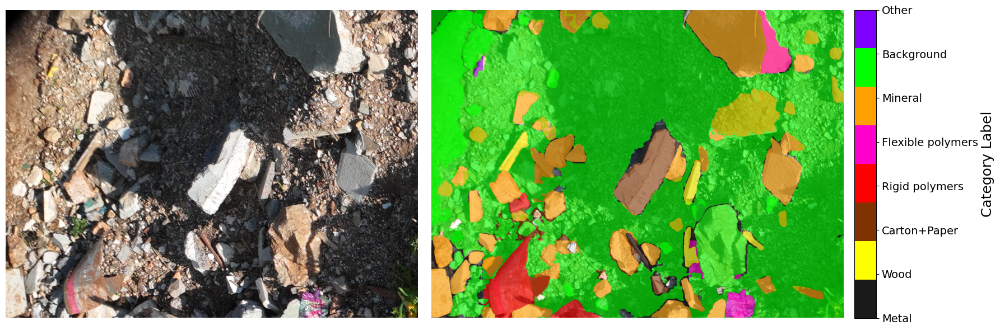

  6%|▋         | 1/16 [00:07<01:51,  7.44s/it]

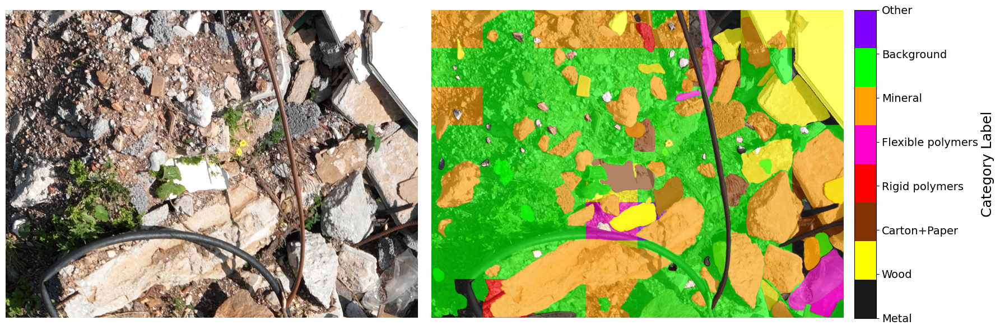

 12%|█▎        | 2/16 [00:12<01:25,  6.12s/it]

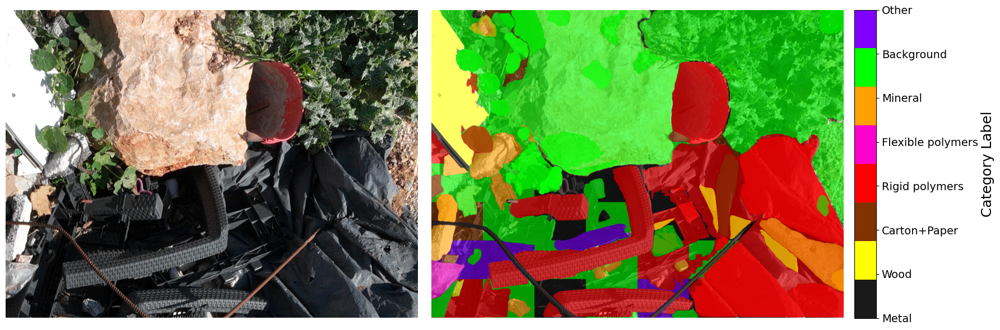

 19%|█▉        | 3/16 [00:17<01:09,  5.38s/it]

In [ ]:
z_outputs, z_inputs, color_images = process_image(f"{file_path.split('.')[0]}", range(16))

In [ ]:
number_of_images=1
for i in random.sample(range(len(z_outputs)), number_of_images):
  softmax_z_outputs_i = F.softmax(z_outputs[i], dim=1)[0]
  plt.figure(figsize=(4,2))
  plt.subplot(1,2,1)
  plot_image(softmax_z_outputs_i.cpu().detach().numpy(), z_inputs[i].cpu().detach().numpy())
  plt.subplot(1,2,2)
  plot_value_array(softmax_z_outputs_i.cpu().detach().numpy())
  plt.show()

In [ ]:
small_images = [cv2.imread(f"{folder_path}/output/here{i}.jpg") for i in range(16)]
rows, cols, _ = small_images[0].shape
big_rows = []
for i in range(0, 16, 4):
    big_row = np.hstack([small_images[i], small_images[i+1], small_images[i+2], small_images[i+3]])
    big_rows.append(big_row)

big_image = np.vstack(big_rows)
cv2.imwrite(f"{folder_path}/output/big_image.jpg", big_image)


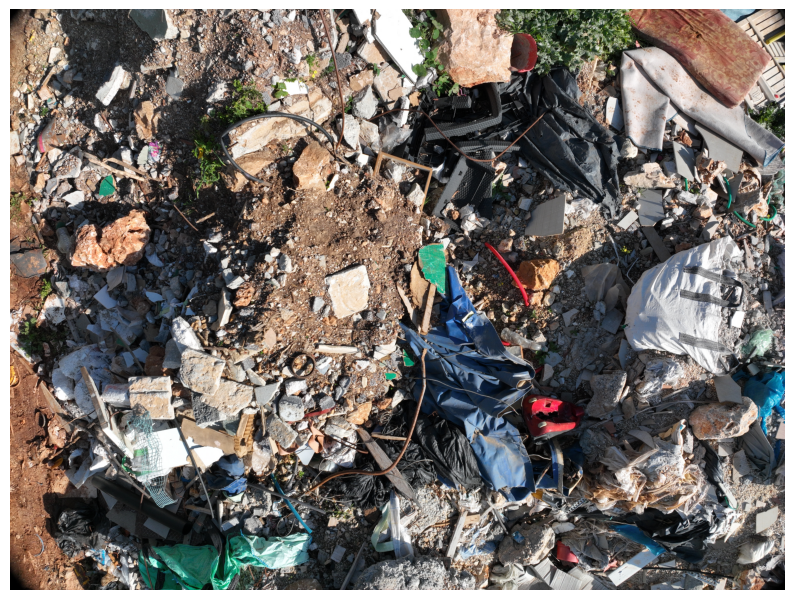

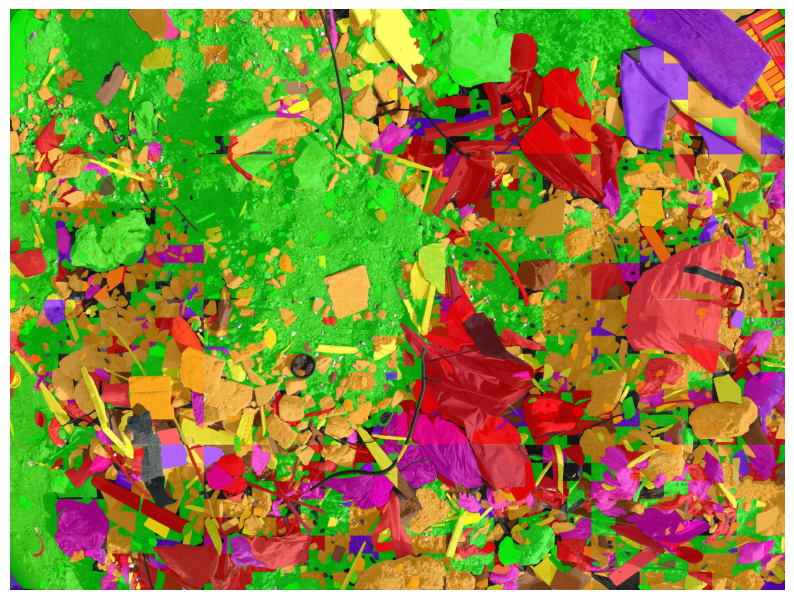

In [ ]:
plt.figure(figsize=(10, 10))
original_img = cv2.imread(file_path)
original_img = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)

plt.imshow(original_img)
plt.axis('off')
plt.show()

big_image = cv2.imread(f"{folder_path}/output/big_image.jpg")
big_image = cv2.cvtColor(big_image, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(10, 10))
plt.imshow(big_image)
plt.axis('off')
plt.show()

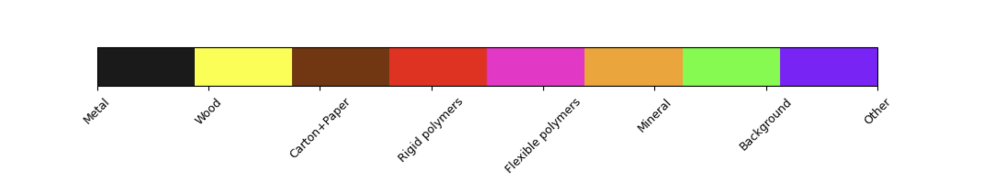